In [6]:
# ========= Cell: YOLOv8 + BLIP Combined Visualization for Fixed Frames =========

# 1. Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Install dependencies (only once)
!pip install ultralytics --quiet
!pip install transformers --quiet
!pip install pillow opencv-python tqdm --quiet

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Selected device: cuda, torch.cuda.device_count(): 1
→ Loading YOLOv8 model…
→ Loading BLIP model…
→ Loaded BLIP from local directory
Video: reading up to frame 1820 to capture SHOW_IDS.
→ Processing video frames…
→ Frame processing complete.
→ Displaying annotated frames for SHOW_IDS: [10, 50, 150, 500, 1820]
▶ Frame 10:


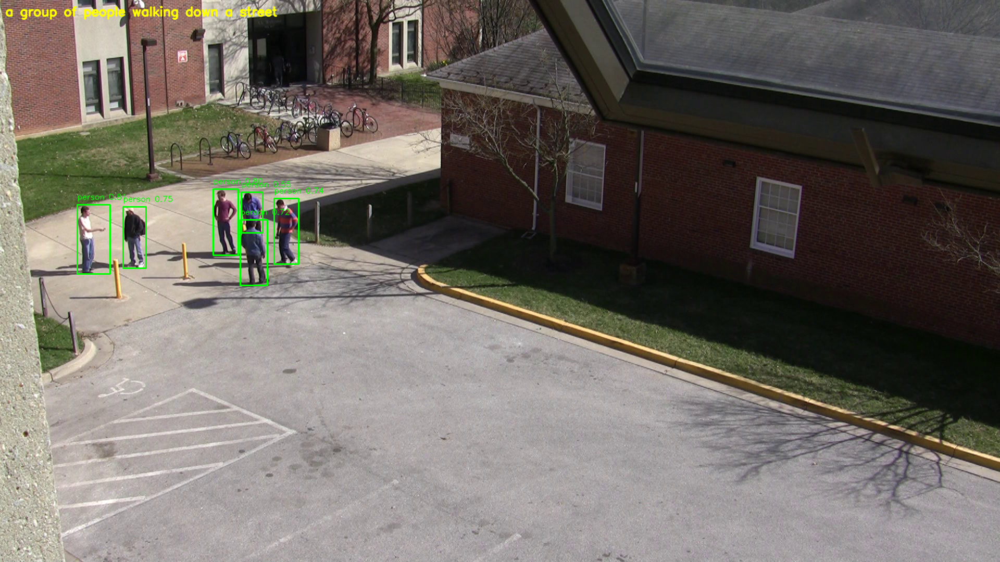

▶ Frame 50:


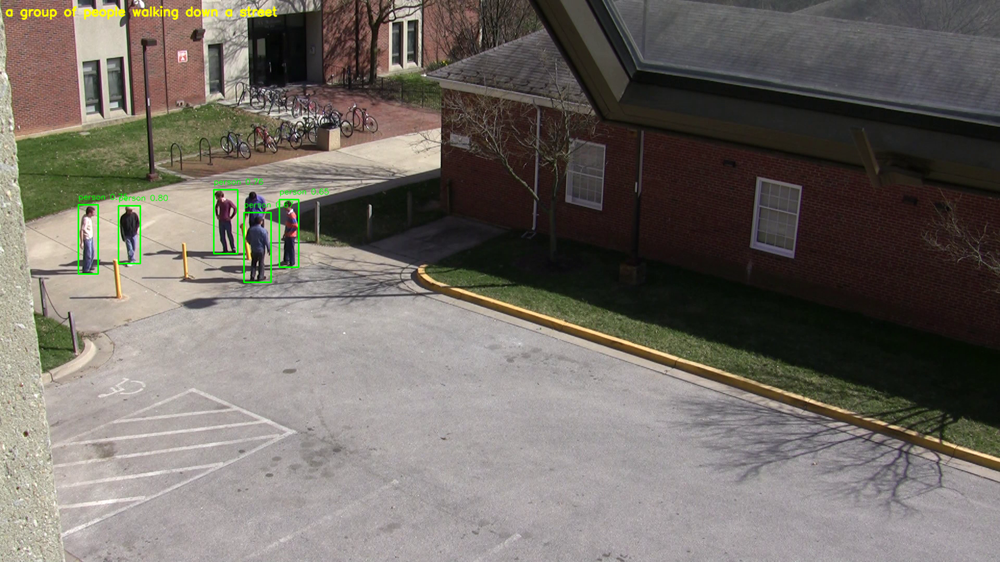

▶ Frame 150:


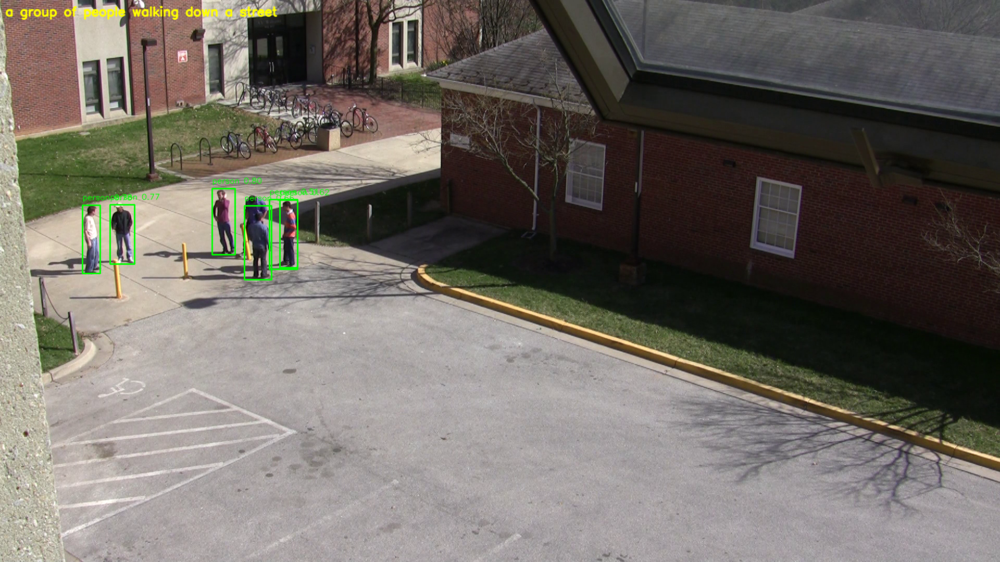

▶ Frame 500:


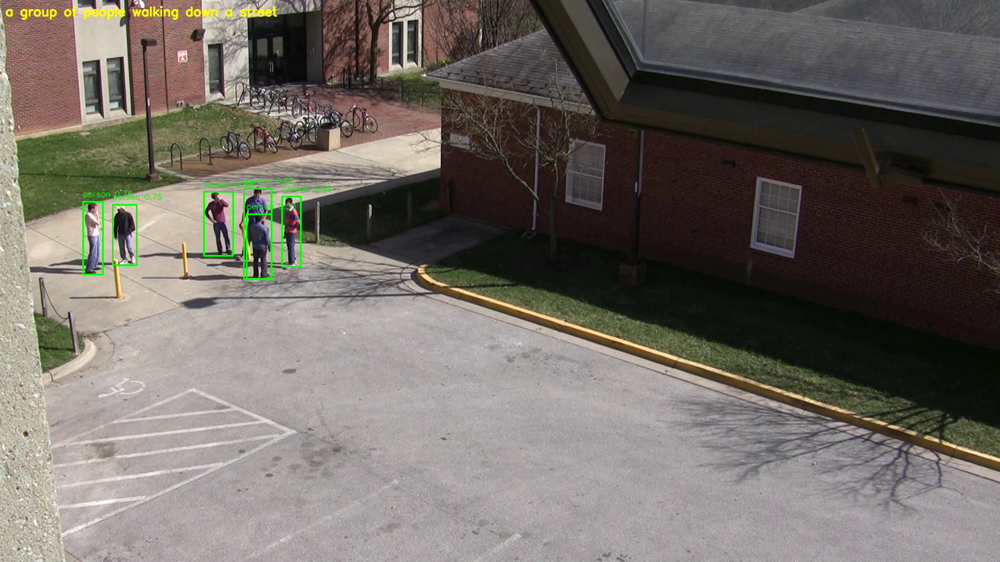

▶ Frame 1820:


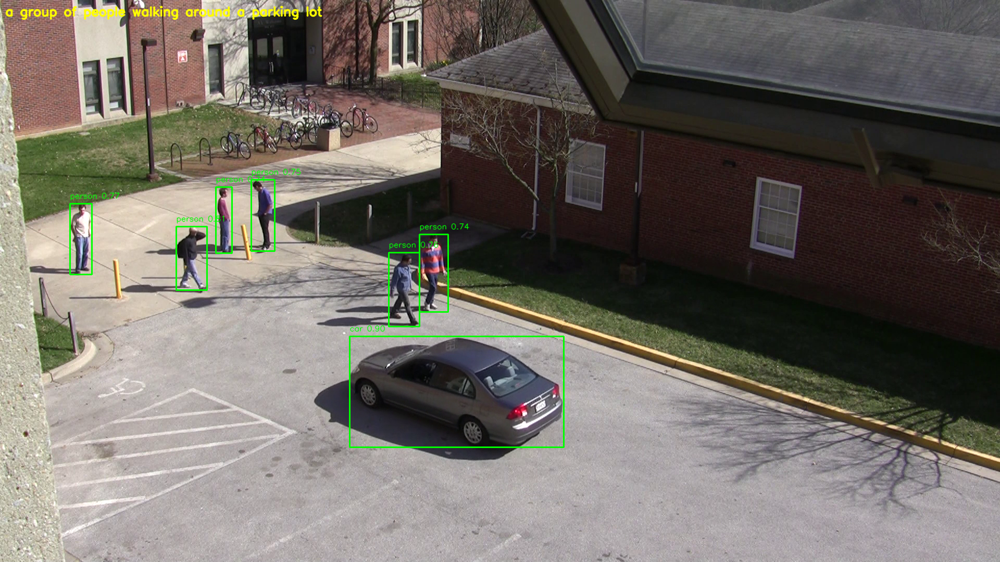

In [10]:
# 3. Import Python libraries
import os
import cv2
import torch
from pathlib import Path
from PIL import Image
from tqdm import tqdm
from ultralytics import YOLO
from transformers import BlipProcessor, BlipForConditionalGeneration
from google.colab.patches import cv2_imshow
from IPython.display import display

# 4. Select device automatically (GPU if available, otherwise CPU)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Selected device: {device}, torch.cuda.device_count(): {torch.cuda.device_count()}")

# 5. Configuration: Drive paths and thresholds
YOLO_WEIGHTS   = "/content/drive/MyDrive/Share_project/Smart_Surveillance_System/models/yolov8s.pt"
BLIP_LOCAL_DIR = "/content/drive/MyDrive/Share_project/Smart_Surveillance_System/models/BLIP_MODEL"
VIDEO_PATH     = "/content/drive/MyDrive/Share_project/Smart_Surveillance_System/video/VIRAT_S_000101.mp4"

CONF_THRESH    = 0.40              # YOLO confidence threshold
BLIP_INPUT_SIZE = (384, 384)       # Resize for BLIP input
MAX_FRAMES          = 2000
SHOW_IDS       = [10, 50, 150, 500, 1820]  # Frames to visualize (fixed indices)

# 6. Load YOLOv8 model
print("→ Loading YOLOv8 model…")
yolo = YOLO(YOLO_WEIGHTS)

# 7. Load BLIP model
print("→ Loading BLIP model…")
try:
    processor = BlipProcessor.from_pretrained(BLIP_LOCAL_DIR)
    blip_model = BlipForConditionalGeneration.from_pretrained(BLIP_LOCAL_DIR).to(device).eval()
    print("→ Loaded BLIP from local directory")
except Exception as e:
    print(f"→ Local BLIP load failed ({e}), downloading from Hugging Face…")
    processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
    blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device).eval()
    print("→ Loaded BLIP from Hugging Face")

# 8. Open the video file
cap = cv2.VideoCapture(VIDEO_PATH)
if not cap.isOpened():
    raise RuntimeError(f"[Error] Cannot open video: {VIDEO_PATH}")

# 9. Determine how many frames to read (up to the maximum SHOW_ID)
max_frame = max(SHOW_IDS)
print(f"Video: reading up to frame {max_frame} to capture SHOW_IDS.")

# 10. Create a dictionary to hold annotated images for each SHOW_ID
annotated_frames = {}

frame_id = 0
print("→ Processing video frames…")
while cap.isOpened() and frame_id < max_frame:
    ret, frame = cap.read()
    if not ret:
        break
    frame_id += 1

    # If this frame is one of the SHOW_IDS, run detection+captioning
    if frame_id in SHOW_IDS:
        annotated = frame.copy()

        # 10.1 Run YOLOv8 detection
        results = yolo.predict(frame, device=device, verbose=False)[0]
        for box in results.boxes:
            cls_id = int(box.cls)
            conf = float(box.conf)
            if conf < CONF_THRESH:
                continue
            cls_name = results.names[cls_id]
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int).tolist()
            cv2.rectangle(annotated, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(
                annotated,
                f"{cls_name} {conf:.2f}",
                (x1, max(y1 - 10, 0)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                (0, 255, 0),
                1,
                cv2.LINE_AA,
            )

        # 10.2 Run BLIP captioning on this frame
        small = cv2.resize(frame, BLIP_INPUT_SIZE)
        small_rgb = cv2.cvtColor(small, cv2.COLOR_BGR2RGB)
        pil_im = Image.fromarray(small_rgb)
        inputs = processor(images=pil_im, return_tensors="pt").to(device)
        with torch.no_grad():
            out_ids = blip_model.generate(**inputs, max_new_tokens=30)
        caption = processor.decode(out_ids[0], skip_special_tokens=True)

        if caption:
            cv2.putText(
                annotated,
                caption,
                (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.8,
                (0, 255, 255),
                2,
                cv2.LINE_AA,
            )

        # 10.3 Store the annotated frame in the dictionary
        annotated_frames[frame_id] = annotated

cap.release()
print("→ Frame processing complete.")

# 11. Display the selected annotated frames in the notebook
print(f"→ Displaying annotated frames for SHOW_IDS: {SHOW_IDS}")
for fid in SHOW_IDS:
    if fid in annotated_frames:
        print(f"▶ Frame {fid}:")
        cv2_imshow(annotated_frames[fid])
    else:
        print(f"[Warning] Frame {fid} was not processed or did not exist.")
